<center>
    <h1>Languages and their Grammatical Features</h1>
    <i>Aryaman Arora</i>
</center>

# Introduction

Language is arguably the most important invention of humankind. Human language as a system of communication is thought to have emerged in modern humans at least 100,000 years ago. Unlike other animals, human language has a level of structural complexity that enables the ability to communicate infinite statements rather than a small set of signals. According to generativists, the property that enables this is **recursion**, or the ability to repeatedly embed phrases within phrases (e.g. "I said that she said that he said..."). While linguists do not agree on what properties make human language so unique, that do agree that it is unique.

However, human language is not a monolith. There are over 8000 living languages spoken throughout the world, some with over a billion speakers (English, Mandarin) and some with just one (e.g. Iskonawa, an indigenous language of Peru). These languages are not all the same, even if one may argue that they share some properties. They differ in their phonology (sounds) and phonotactic (how sounds are built into words), their morphology (how words are formed), their syntax (the way words are structured into sentences), and their semantics (the meaning of words and sentences).

What factors are responsible for this broad variation in linguistic properties? Do geography, history, climate, or culture play a role, and to what extent? Or do languages change at random?

In this final project, I will explore various linguistic features (e.g. "do adjectives occur before the noun they modify or after?") and how the factors I mentioned may affect them using the data science techniques we have learned. The dataset I will primarily use is the recently released [GramBank](https://grambank.clld.org/), which covers 2,467 languages and 195 linguistic features.

**References**
- Skirgård, Hedvig, et al. "[Grambank reveals the importance of genealogical constraints on linguistic diversity and highlights the impact of language loss](https://www.science.org/doi/10.1126/sciadv.adg6175)." *Science Advances* 9.16 (2023): 143-151.

---

First just a couple imports. Besides the usual data science libraries, for visualisation I'll be using [folium](https://python-visualization.github.io/folium/) (a geospatial data processing library for mapping) and [plotnine](https://plotnine.readthedocs.io/en/stable/) (a port of R's ggplot that is nicely integrated with pandas and just generally cleaner than matplotlib).

In [1]:
# basic data analysis
import csv
import pandas as pd
from tqdm import tqdm
import numpy as np
from IPython.display import Markdown
from collections import Counter
import random

# ML/regressions
from sklearn.metrics import adjusted_mutual_info_score, classification_report, accuracy_score
from sklearn import linear_model
from sklearn.model_selection import train_test_split
import statsmodels.formula.api as smf
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier

# visualisation
import folium
import matplotlib.pyplot as plt
import matplotlib.colors
from plotnine import ggplot, aes, geom_bar, theme, element_text, geom_tile, geom_point, geom_boxplot, geom_text, scale_fill_gradient, facet_wrap

%config InlineBackend.figure_format = 'png'

# Loading data

The data is in CLDF (Cross-Linguistic Data Format), which is a standard for storing linguistic data in a tabular form. I will read the data from the csvs and convert it into long `pandas` dataframe and Python dicts for easier manipulation.

Basically, there are four data tables we will be using:
- languages: the list of languages and information about them (family, coordinates, etc.)
- values: linguistic feature data for all languages
- parameters: information about each feature in human-readable format (Markdown page)
- codes: information about what each feature code means

In [2]:
# make language and values list
languages = []
values = []
parameters = {}
codes = {}

# each lang is in the language table
with open('grambank/cldf/languages.csv', 'r') as f:
    reader = csv.DictReader(f)
    for row in reader:
        languages.append(row)

# each linguistic property is in the values table
with open('grambank/cldf/values.csv', 'r') as f:
    reader = csv.DictReader(f)
    for row in reader:
        values.append(row)

# get the parameters (linguistic features + descriptions of them), only for human reference
with open('grambank/cldf/parameters.csv', 'r') as f:
    reader = csv.DictReader(f)
    for row in reader:
        parameters[row['ID']] = row
        
# get codes (for human ref)
with open('grambank/cldf/codes.csv', 'r') as f:
    reader = csv.DictReader(f)
    for row in reader:
        codes[(row['Parameter_ID'], row['Name'])] = row['Description']

# convert to dataframes
languages = pd.DataFrame(languages)
values = pd.DataFrame(values)

# Exploratory Data Analysis (EDA)

## Exploring languages

We can peek at the languages table to see what kind of data we have. This shows that we have:
- Language ID (which should be identical to the Glottocode column--this references another linguistic database, [Glottolog](https://glottolog.org/))
- Name
- Macroarea (a broad geographical area)
- Latitude
- Longitude

The other columns aren't important for our purposes.

In [3]:
print(len(languages))

# set all column types to str
languages = languages.astype(str)

# set empty vals to NaN
languages = languages.replace(r'^[\s\?]*$', np.nan, regex=True)

# set column types
languages['Latitude'] = languages['Latitude'].astype(float)
languages['Longitude'] = languages['Longitude'].astype(float)

languages.head()

2467


,ID,Name,Macroarea,Latitude,Longitude,Glottocode,ISO639P3code,provenance,Family_name,Family_level_ID,Language_level_ID,level,lineage
0,abad1241,Abadi,Papunesia,-9.03389,146.99200,abad1241,NaN,JLA_abad1241.tsv,Austronesian,aust1307,abad1241,language,aust1307/mala1545/cent2237/east2712/ocea1241/w...
1,abar1238,Mungbam,Africa,6.58050,10.22670,abar1238,NaN,ML_abar1238.tsv,Atlantic-Congo,atla1278,abar1238,language,atla1278/volt1241/benu1247/bant1294/sout3152/y...
2,abau1245,Abau,Papunesia,-3.97222,141.32400,abau1245,NaN,MD-GR-RSI_abau1245.tsv,Sepik,sepi1257,abau1245,language,sepi1257
3,abee1242,Abé,Africa,5.59682,-4.38497,abee1242,NaN,RHE_abee1242.tsv,Atlantic-Congo,atla1278,abee1242,language,atla1278/volt1241/kwav1236/nyoa1234/agne1238
4,aben1249,Abenlen Ayta,Papunesia,15.41310,120.20000,aben1249,NaN,SR_aben1249.tsv,Austronesian,aust1307,aben1249,language,aust1307/mala1545/cent2080/samb1319/abel1234


We can also map all the languages just to see how our sample is distributed. I will colour each point by which language family that language belongs to.

As you can see, the densest areas of the world are Papua New Guinea (the most linguistically diverse country in the world), the Philippines, Southeast Asia, Central Africa, and Mesoamerica. Our dataset is a little sparse for Europe, South America, and the Middle East, but it is still an impressive collection of languages---much better than anything even a few years ago or that I could put together myself.

In [4]:
# family names as codes (for colours)
languages_copy = languages
languages_copy['Family_code'] = languages_copy['Family_name'].astype('category').cat.codes
languages_copy = languages_copy.dropna(subset=['Latitude', 'Longitude'], how='any')

# make color map
colors = plt.cm.hsv(np.linspace(0, 1, len(languages_copy['Family_code'].unique())))
color_dict = {code: colors[i] for i, code in enumerate(languages_copy['Family_code'].unique())}

# base map
m = folium.Map(location=[0, 0], zoom_start=2)

# add points
for idx, row in languages_copy.iterrows():
    popup_text = f"{row['Name']}\n{row['Family_name']}"
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,  # Adjust size if needed
        color=matplotlib.colors.to_hex(color_dict[row['Family_code']]),
        fill=True,
        fill_opacity=0.8,
        weight=0,
        popup=folium.Popup(popup_text, parse_html=True)  # Add a popup to the CircleMarker
    ).add_to(m)

# display
m

## Exploring linguistic features

Now we can check out some of the linguistic features encoded in the dataset. I'll quickly show the head of the table, from which we see that each row is a feature+language pair. The columns are:

- ID
- Language_ID: points to a language in our languages table
- Parameter_ID: the feature for which this row has a value
- Value: the value (a number)
- Code_ID: reference to the codes table, telling what the value means to a human
- Comment: further info
- Source
- Source_comment
- Coders: who entered this data

In [5]:
print(len(values))

# set all column types to str
values = values.astype(str)

# set empty vals to NaN
values = values.replace(r'^[\s\?]*$', np.nan, regex=True)

# humanise values
for parameter in tqdm(values['Parameter_ID'].unique()):
    human_names = {x[1]: codes[x] for x in [x for x in codes.keys() if parameter in x]}
    values.loc[values['Parameter_ID'] == parameter, 'Value'] = values.loc[values['Parameter_ID'] == parameter, 'Value'].replace(human_names)
    
# fix nans
values = values.replace(r'^nan$', np.nan, regex=True)

values.head()

441663


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 195/195 [00:10<00:00, 17.77it/s]


,ID,Language_ID,Parameter_ID,Value,Code_ID,Comment,Source,Source_comment,Coders
0,GB020-abad1241,abad1241,GB020,NaN,NaN,Author states there is a possible example of a...,s_OaPaul_Gabadi[17],Oa & Paul 2013:17,JLA
1,GB021-abad1241,abad1241,GB021,NaN,NaN,Author states there is a possible example of a...,s_OaPaul_Gabadi[17],Oa & Paul 2013:17,JLA
2,GB022-abad1241,abad1241,GB022,NaN,NaN,Author states there is a possible example of a...,s_OaPaul_Gabadi[17],Oa & Paul 2013:17,JLA
3,GB023-abad1241,abad1241,GB023,NaN,NaN,Author states there is a possible example of a...,s_OaPaul_Gabadi[17],Oa & Paul 2013:17,JLA
4,GB024-abad1241,abad1241,GB024,N-Num,GB024-2,NaN,s_OaPaul_Gabadi[15],Oa & Paul 2013:15,JLA


### Deep dive: Feature GB024

Now we will examine the feature GB024. First, we need to check what it's actually encoding. Recall that I read in all the information about linguistic features into the `parameters` dict, so we can just look at the Markdown description in there!

This uses linguistic terminology so it may not all be easily understandable, but the gist should be clear: GB024 encodes whether a number precedes the noun it counts (e.g. "two books") or follows it ("books two").

In [6]:
from IPython.display import Markdown

Markdown('>' + parameters['GB024']['Description'].replace('\n', '\n> '))

>## What is the order of numeral and noun in the NP?
> 
> ## Summary
> This feature focuses on the order of cardinal numerals (not ordinal numerals) and nouns in quantified noun phrases. In some languages only one order (Numeral-Noun or Noun-Numeral) is possible. In other languages both orders may be possible. This can take the form of free variation (where Numeral-Noun and Noun-Numeral order can occur interchangeably). The order may also depend on some other grammatical category which is neutral with respect to pragmaticality (e.g. definiteness). If the order depends on the noun, consider only the orders that apply to an open class of nouns and disregard orders that are restricted to a specific closed class of nouns.
> 
> ## Procedure
> 1. Consider only phrases with the meaning 'X (numeral) units of Y (noun)' in their pragmatically neutral form. It does not matter what kind of construction is required (e.g. attributive *two books* or relative *books that are two*) or what word class the root or modifying form of the cardinal numerals belongs to, e.g. *two-ing books* (verb) or *two-some books* (noun) apply to this question.
> 2. If the numeral always precedes the noun, code 1. 
> 3. If the numeral always follows the noun, code 2.
> 4. If a closed class of nouns requires a different order than an open class, disregard the closed class and code the order that applies to the open class.
> 5. If both orders occur for an open class of nouns, that is if some numerals precede and some follow, or there is a free choice or there is a choice depending on some other factor (e.g. definiteness), code 3.
> 
> ## Examples
> 
> **Skolt Saami** (ISO 639-3: sms, Glottolog: skol1241)
> 
> In Skolt Saami, the unmarked order of elements in the noun phrase always places the numeral before the noun (Feist 2010: 208). Skolt Saami is coded 1.
> 
> ```
> tõid        kueʹhtt  sueʹjj
> DEM.PL.NOM  two      birch.SG.GEN
> ‘those two birch trees’ (Feist 2010: 209)
> ```
> 
> **Assiniboine** (ISO 639-3: asb, Glottolog: assi1247)
> 
> Assiniboine cardinal numbers consistently follow the noun (Cumberland 2005: 363). Assiniboine is coded 2.
> 
> ```
> šų́katʰą́ka  iyúšna  žé   miní  žén    0-iyáyaa-ka  
> horse      seven   DET  lake  there  3SG.A.go-DUR
> ‘the seven horses kept going into the lake’ (Cumberland 2005: 365)
> ```
> 
> **Phake** (ISO 639-3: phk, Glottolog: phak1238) and **Aiton** (ISO 639-3: aio, Glottolog: aito1238)
> 
> In the Tai languages Phake and Aiton, the numeral precedes the noun when there is no classifier, and the numeral follows the noun when there is a classifier (Morey 2005: 240–241). Both languages are coded 3.
> 
> ## Further reading
> This feature is akin to Dryer (2013). Matthew Dryer has written a paper remarking on the distribution of noun-numeral order in Africa (among other nominal modifiers). 
> 
> Dryer, Matthew S. 2011. Noun-modifier order in Africa. In Osamu Hieda, Christa König & Hirosi Nakagawa (eds), *Geographical typology and linguistic areas: With special reference to Africa*, 287–311. Amsterdam: John Benjamins.
> 
> Dryer, Matthew S. 2013. [Order of numeral and noun](http://wals.info/chapter/89). In Matthew S. Dryer & Martin Haspelmath (eds), *The world atlas of language structures online*. Leipzig: Max Planck Institute for Evolutionary Anthropology.
> 
> ## References
> 
> Cumberland, Linda A. 2005. *A grammar of Assiniboine: A Siouan language of the Northern Plains (Montana, Saskatchewan)*. Indiana University. (Doctoral dissertation.)
> 
> Feist, Timothy. 2010. *A grammar of Skolt Saami*. Manchester: University of Manchester. (Doctoral dissertation.)
> 
> Morey, Stephen. 2005. *The Tai languages of Assam*. (Pacific Linguistics, 565.) Canberra: Research School of Pacific and Asian Studies, Australian National University.
> 
> ## Related Features
> 
> * [GB193 What is the order of adnominal property word and noun?](https://github.com/grambank/Grambank/wiki/GB193)
> 
> ## Patron
> Hannah J. Haynie
> 

Now we can plot the values of this feature on the map.

In [7]:
# extract 'GB024' data and merge with 'languages' table
feature = values[values['Parameter_ID'] == 'GB024'].merge(languages, left_on='Language_ID', right_on='ID', how='left')

# family names as codes (for colours)
feature['Value_code'] = feature['Value'].astype('category').cat.codes
feature = feature.dropna(subset=['Latitude', 'Longitude'], how='any')

# make color map
colors = plt.cm.tab10(list(range(len(feature['Value_code'].unique()))))
color_dict = {code: colors[i] for i, code in enumerate(feature['Value_code'].unique())}

# base map
m = folium.Map(location=[0, 0], zoom_start=2)

# add points
for idx, row in feature.iterrows():
    popup_text = f"{row['Name']}\n{row['Value']}"
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,  # Adjust size if needed
        color=matplotlib.colors.to_hex(color_dict[row['Value_code']]),
        fill=True,
        fill_opacity=0.8,
        weight=0,
        popup=folium.Popup(popup_text, parse_html=True)  # Add a popup to the CircleMarker
    ).add_to(m)

# display
m

For a specific feature, we can also visualise how the values for that feature are distributed between different language families. Languages are grouped into families based on shared history and evolution of their grammar, much like the biological grouping of family. By this analogy, linguistic features are like traits, which may mutate over time but generally we expect a family to share many traits.

As you can see below, many of the top 20 largest language families in our dataset are remarkably homogenous in their numeral-noun ordering. For example, Indo-European languages almost always have the numeral before the noun, while Atlantic-Congo languages tend to be the other way.

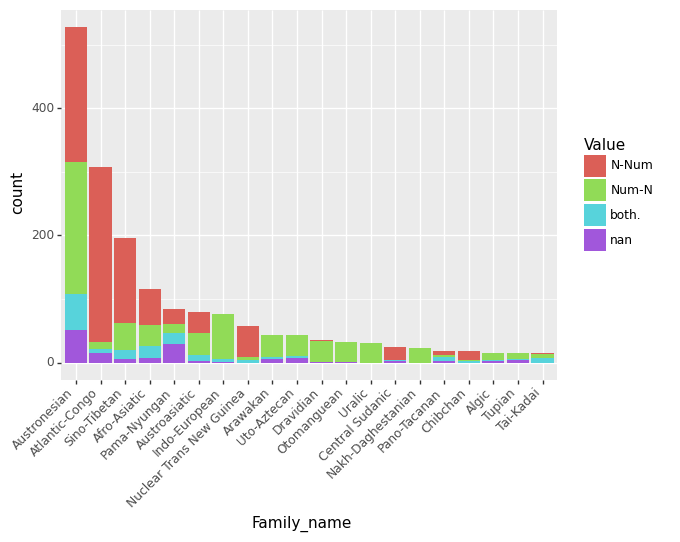

In [8]:
# group by Family_name and take only top 10 by count
top_names = feature.groupby('Family_name').size().reset_index(name='counts')
top_names = top_names.sort_values(by='counts', ascending=False).head(20)
filtered = feature[feature['Family_name'].isin(top_names['Family_name'])]
filtered = filtered.astype(str)

# calculate order of Family_name based on counts
order = filtered['Family_name'].value_counts().index

# convert and reorder Family_name to a categorical type
filtered['Family_name'] = pd.Categorical(filtered['Family_name'], categories=order, ordered=True)

# plot
p = ggplot(filtered, aes(x='Family_name', fill='Value')) + geom_bar(stat='count') +\
    theme(axis_text_x=element_text(angle=45, hjust=1))
print(p)

# Hypothesis testing

## Finding correlations between features

To get a better sense of the data and to find some features to develop hypotheses about, I want to find which linguistic features are correlated. Since the data is discrete (not continuous), we can't use e.g. $R^2$ but instead have to use a metric that tells us correlations between discrete-valued random variables. A great metric from information theory is [mutual information](https://en.wikipedia.org/wiki/Mutual_information), which tells us how much knowing one random variable tells us about another one. Formally, mutual information is defined as:

$$I(X; Y) = \sum_{y \in \mathcal Y} \sum_{x \in \mathcal X}
    { P_{(X,Y)}(x, y) \log\left(\frac{P_{(X,Y)}(x, y)}{P_X(x)\,P_Y(y)}\right) }$$

Intuitively, mutual information is the difference between the entropy ("randomness") of a random variable and its entropy conditioned on the other random variable:

$$I(X; Y) = H(X) - H(X \mid Y) = H(Y) - H(Y \mid X)$$

That is, mutual information quantifies how much the apparent randomness of one variable decreases once we know the actual value of another random variable. If there is some correlation, than MI will be positive. If they are independent, it will be 0.

Of course, MI doesn't take into account correlation by chance. Thus, a new measure called **adjusted mutual information** was introduced, which subtracts the *expected* MI between two random distributions from the actual MI we calculate between two variables. I won't go further into it here, but AMI has the nice property of being normalised, i.e. AMI = 0 means no correlation (or not better than random) and AMI = 1 means perfect correlation.

So, we can now proceed to finding the most highly correlated features. First, we'll make our data wide in order to increase the efficiency of running AMI between all pairs of features (which can otherwise be very slow).

In [9]:
pivot_df = values.pivot(index='Language_ID', columns='Parameter_ID', values='Value').reset_index()
pivot_df.head()

Parameter_ID,Language_ID,GB020,GB021,GB022,GB023,GB024,GB025,GB026,GB027,GB028,...,GB421,GB422,GB430,GB431,GB432,GB433,GB519,GB520,GB521,GB522
0,abad1241,NaN,NaN,NaN,NaN,N-Num,Dem-N,absent,absent,present,...,NaN,NaN,absent,absent,absent,present,NaN,NaN,NaN,present
1,abar1238,present,absent,absent,present,N-Num,N-Dem,absent,absent,absent,...,present,absent,NaN,NaN,NaN,NaN,absent,absent,present,absent
2,abau1245,absent,absent,absent,absent,N-Num,N-Dem,absent,present,absent,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,abee1242,present,absent,absent,present,N-Num,N-Dem,NaN,present,absent,...,NaN,NaN,absent,absent,absent,absent,absent,absent,absent,present
4,aben1249,absent,absent,absent,absent,Num-N,Dem-N,NaN,NaN,present,...,NaN,NaN,NaN,NaN,NaN,NaN,present,present,NaN,NaN


Now, we can calculated AMI for each pair.

In [10]:
def adjusted_mutual_information(x, y):
    temp = pivot_df.dropna(subset=[x, y])
    res = adjusted_mutual_info_score(temp[x], temp[y])
    return res

vals = []
    
ling_features = list(values['Parameter_ID'].unique())
for i, x in enumerate(tqdm(ling_features)):
    for y in ling_features[i + 1:]:
        vals.append((adjusted_mutual_information(x, y), x, y))

vals.sort(reverse=True)
print(vals[:10])

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 195/195 [02:27<00:00,  1.33it/s]

[(0.73712795908445, 'GB090', 'GB092'), (0.6926158981006285, 'GB089', 'GB091'), (0.5530965210244043, 'GB314', 'GB315'), (0.5148314723657789, 'GB130', 'GB131'), (0.48643631302092477, 'GB170', 'GB171'), (0.48504984154887204, 'GB170', 'GB198'), (0.4331803399146962, 'GB171', 'GB198'), (0.39030729818784243, 'GB074', 'GB133'), (0.3860454143509086, 'GB113', 'GB155'), (0.3530981349995918, 'GB070', 'GB071')]


Finally, we can make this more human readable and put the results in a DataFrame.

In [11]:
ami_features = pd.DataFrame(vals, columns=['AMI', 'Feature1', 'Feature2'])
ami_features['Feature1Desc'] = [parameters[x]['Name'] for x in ami_features['Feature1']]
ami_features['Feature2Desc'] = [parameters[x]['Name'] for x in ami_features['Feature2']]
ami_features.head()

,AMI,Feature1,Feature2,Feature1Desc,Feature2Desc
0,0.737128,GB090,GB092,Can the S argument be indexed by a prefix/proc...,Can the A argument be indexed by a prefix/proc...
1,0.692616,GB089,GB091,Can the S argument be indexed by a suffix/encl...,Can the A argument be indexed by a suffix/encl...
2,0.553097,GB314,GB315,Can augmentative meaning be expressed producti...,Can diminutive meaning be expressed productive...
3,0.514831,GB130,GB131,What is the pragmatically unmarked order of S ...,Is a pragmatically unmarked constituent order ...
4,0.486436,GB170,GB171,Can an adnominal property word agree with the ...,Can an adnominal demonstrative agree with the ...


## Significance of most-correlated features

Now, let's visualise the first couple pairs in a more human-readable format: a confusion matrix! The rows and columns can be different options for the features, and each entry in the matrix can be the count of languages that have that pair of features. After that, I'll used linguistics domain knowledge to explain why it makes sense that these features are so highly correlated, and we can move on to testing some hypotheses.

Let's start with GB090 and GB092:

- GB090: Can the S argument be indexed by a prefix/proclitic on the verb in the simple independent clause?
- GB092: Can the A argument be indexed by a prefix/proclitic on the verb in the simple independent clause?

*Explanation*:

The S argument is the sole entity participating in the action of an intransitive verb, e.g. in "He walks", "He" is an S argument. The A argument is the agent/subject of a transitive verb, e.g. in "He eats food", "He" is the A argument. Both these features are asking whether, in a particular language, S/A arguments are indicated by a prefix on the verb.

English indicates this stuff by suffixes on the verb. For example, we say "He wants" but "I want"; the subject of a verb changes its ending. Some languages use prefixes instead, which is what these features are encoding.

Now for the confusion matrix:

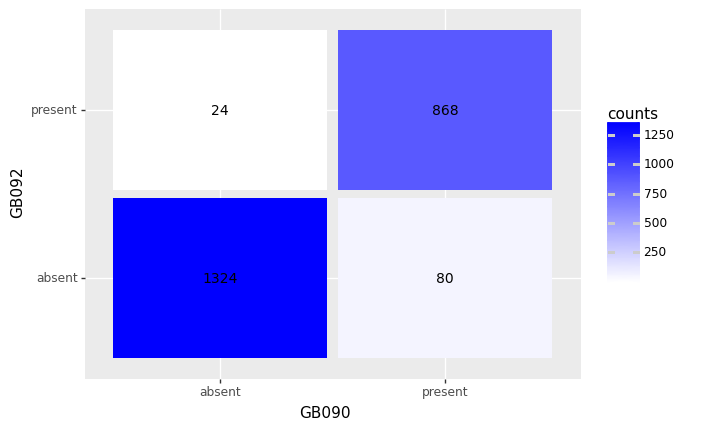

In [12]:
def plot_confusion_matrix(x, y):
    """Get paired counts for two features."""
    temp = pivot_df
    counts = temp.groupby([x, y]).size().reset_index(name='counts')
    temp_counts = counts.pivot_table(index=x, columns=y, values='counts', fill_value=0).reset_index()
    counts = temp_counts.melt(id_vars=x, value_name='counts', var_name=y)

    p = (ggplot(counts, aes(x=f'factor({x})', y=f'factor({y})', fill='counts'))
         + geom_tile(aes(width=.95, height=.95))  # .95 to leave a slight gap between tiles
         + geom_text(aes(label='counts'), size=10, color='black')
         + scale_fill_gradient(low="white", high="blue")
         + theme(axis_title_x=element_text(text=x),
                 axis_title_y=element_text(text=y, angle=90))
    )
    print(p)

plot_confusion_matrix('GB090', 'GB092')

As you can see, most of the mass of the languages for these two features are concentrated in the "absent"/"absent" and "present"/"present" pairs. That is to say, a language generally uses prefixes on the verb in *both* S and A arguments or neither. Interestingly, marking S but not A is more common (80 languages) than the reverse (24 languages).

It seems pretty obvious that these features are correlated. Let's run a logistic regression now to confirm!  We will code each feature as a boolean variable, indicating "present" as 1 and "absent" as 0.

As you can see, great performance and the p-value is much less than 0.05, so this is a significant comparison.

In [13]:
def run_logistic_regression(x, y):
    # get dataset (dropping N/As)
    temp = pivot_df.dropna(subset=[x, y], how='any')
    temp = temp.replace('present', 1)
    temp = temp.replace('absent', 0)
    X, Y = np.array(list(temp[x])).reshape(-1, 1), list(temp[y])

    # logistic regression
    log_reg = smf.logit(f"{x} ~ {y}", data=temp).fit()
    return log_reg

run_logistic_regression('GB090', 'GB092').summary()

Optimization terminated successfully.
         Current function value: 0.181762
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  GB090   No. Observations:                 2296
Model:                          Logit   Df Residuals:                     2294
Method:                           MLE   Df Model:                            1
Date:                Sun, 20 Aug 2023   Pseudo R-squ.:                  0.7319
Time:                        20:24:46   Log-Likelihood:                -417.32
converged:                       True   LL-Null:                       -1556.4
Covariance Type:            nonrobust   LLR p-value:                     0.000
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -2.8064      0.115    -24.375      0.000      -3.032      -2.581
GB092          6.3945      0.237     27.004      0.000       5.930       6.859
==============================================================================
"""

## Least-correlated features

Now let's check out the least correlated features. Let's hope the p-value of their logistic regression is not significant!

In [14]:
ami_features.tail()

,AMI,Feature1,Feature2,Feature1Desc,Feature2Desc
18910,-0.003064,GB285,GB314,Can polar interrogation be marked by a questio...,Can augmentative meaning be expressed producti...
18911,-0.003110,GB336,GB402,Is there a body-part tallying system?,Does the verb for 'see' have suppletive verb f...
18912,-0.003380,GB285,GB336,Can polar interrogation be marked by a questio...,Is there a body-part tallying system?
18913,-0.003870,GB129,GB402,"Is there a notably small number, i.e. about 10...",Does the verb for 'see' have suppletive verb f...
18914,-0.003939,GB285,GB402,Can polar interrogation be marked by a questio...,Does the verb for 'see' have suppletive verb f...


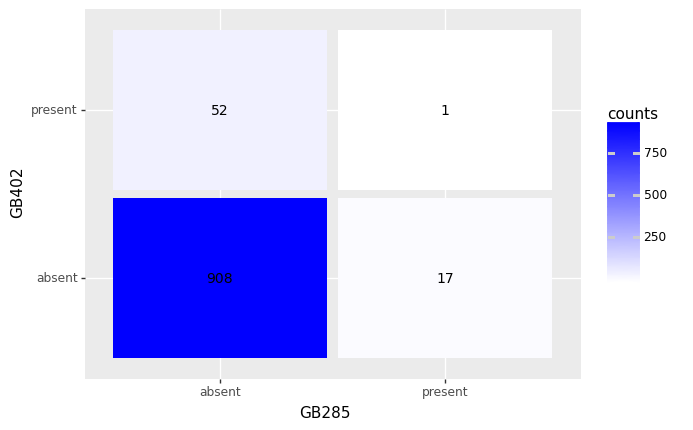

In [15]:
plot_confusion_matrix('GB285', 'GB402')

In [16]:
run_logistic_regression('GB285', 'GB402').summary()

Optimization terminated successfully.
         Current function value: 0.091764
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  GB285   No. Observations:                  978
Model:                          Logit   Df Residuals:                      976
Method:                           MLE   Df Model:                            1
Date:                Sun, 20 Aug 2023   Pseudo R-squ.:               3.676e-06
Time:                        20:24:46   Log-Likelihood:                -89.745
converged:                       True   LL-Null:                       -89.746
Covariance Type:            nonrobust   LLR p-value:                    0.9795
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -3.9780      0.245    -16.250      0.000      -4.458      -3.498
GB402          0.0268      1.039      0.026      0.979      -2.009       2.063
==============================================================================
"""

Unsurprisingly, knowing GB402 is useless for predicting GB285, with a p-value of 0.979 and the coefficient being almost 0 (i.e. almost no effect on the log-odds--it's decided by the intercept).

Now, let's move on to machine learning.

# Machine learning

Finally, we're going to use machine learning to answer a much more interesting question: can we predict linguistic features using non-linguistic information about the language? This could be geographical coordinates, climate where it is spoken, altitude, number of speakers, and so on. Since we know the history of a language (e.g. the family it belongs to) has a strong effect on its traits, just like in biology and evolution, we are essentially asking the nature vs. nurture question but in a linguistic setting.

We will start by seeing which features are the most predictable by just using neighbouring languages to do the classification. This is perfectly operationalised by using the KNN algorithm that we learned in class.

## Basic KNN: Coordinates $\to$ Feature value

I will first merge the languages table with our `pivot_df`, which gives us a nice summary of our entire dataset with each language as a row. Then, I'll play around with KNN hyperparameters and try it out on all the linguistic features in our dataset.

In [17]:
pivot_df_ext = pivot_df.merge(languages, left_on='Language_ID', right_on='ID', how='left')
pivot_df_ext.head()

,Language_ID,GB020,GB021,GB022,GB023,GB024,GB025,GB026,GB027,GB028,...,Longitude,Glottocode,ISO639P3code,provenance,Family_name,Family_level_ID,Language_level_ID,level,lineage,Family_code
0,abad1241,NaN,NaN,NaN,NaN,N-Num,Dem-N,absent,absent,present,...,146.99200,abad1241,NaN,JLA_abad1241.tsv,Austronesian,aust1307,abad1241,language,aust1307/mala1545/cent2237/east2712/ocea1241/w...,13
1,abar1238,present,absent,absent,present,N-Num,N-Dem,absent,absent,absent,...,10.22670,abar1238,NaN,ML_abar1238.tsv,Atlantic-Congo,atla1278,abar1238,language,atla1278/volt1241/benu1247/bant1294/sout3152/y...,11
2,abau1245,absent,absent,absent,absent,N-Num,N-Dem,absent,present,absent,...,141.32400,abau1245,NaN,MD-GR-RSI_abau1245.tsv,Sepik,sepi1257,abau1245,language,sepi1257,162
3,abee1242,present,absent,absent,present,N-Num,N-Dem,NaN,present,absent,...,-4.38497,abee1242,NaN,RHE_abee1242.tsv,Atlantic-Congo,atla1278,abee1242,language,atla1278/volt1241/kwav1236/nyoa1234/agne1238,11
4,aben1249,absent,absent,absent,absent,Num-N,Dem-N,NaN,NaN,present,...,120.20000,aben1249,NaN,SR_aben1249.tsv,Austronesian,aust1307,aben1249,language,aust1307/mala1545/cent2080/samb1319/abel1234,13


Now just defining the KNN training function.

One issue that came to mind while setting this up is, what metric should we use? Accuracy on a held-out set is the usual metric for checking how good a KNN is, but recall that our features are sometimes really skewed (e.g. almost all languages have one value for a particular feature). In the case where the distribution of values is heavily skewed, we may get a great accuracy but the model may just be predicting one value all the time.

What we want to know is how much better our model is than if it didn't know the geography at all. How can we measure this? You guessed it, we can just check the **adjusted mutual information** between the predictions and the answer.

AMI is probably my favourite metric.

In [18]:
def train_knn(x, y, k=3):
    # get data, dropping nans
    df = pivot_df_ext.dropna(subset=x + [y], how='any')
    X = df[x]
    y = df[y]
    
    # split dataset into training set and test set
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    
    # center and scale features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test_old = X_test
    X_test = scaler.transform(X_test)
    
    # create KNN Classifier
    knn = KNeighborsClassifier(n_neighbors=k)

    # train
    knn.fit(X_train, y_train)

    # get predictions
    y_pred = knn.predict(X_test)

    # Model Accuracy
    acc = accuracy_score(y_test, y_pred)
    ami = adjusted_mutual_info_score(y_test, y_pred)
    # print("Accuracy:", acc)
    # print("\nClassification Report:\n", classification_report(y_test, y_pred))
    
    return knn, X_test_old, y_test, y_pred, acc, ami

Let's map KNN accuracy for the feature GB024 (numeral-noun order), with k = 3. You will see that there are no obvious patterns to the mistakes in the predictions; they seem randomly distributed throughout the world.

Also, the KNN is pretty decent! Its accuracy is 0.768 which is much better than randomly guessing.

In [19]:
# train model
knn, X, y_test, y_pred, acc, ami = train_knn(['Latitude', 'Longitude'], 'GB024')
print('KNN accuracy:', acc)
print('KNN AMI:', ami)
y_test = np.array(y_test).reshape(-1)
y_pred = np.array(y_pred).reshape(-1)
acc = y_test == y_pred

# base map
m = folium.Map(location=[0, 0], zoom_start=2)

# add points
i = 0
for idx, row in X.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,  # Adjust size if needed
        color='green' if acc[i] else 'red',
        fill=True,
        fill_opacity=0.8,
        weight=0,
    ).add_to(m)
    i += 1

# display
m

KNN accuracy: 0.7522727272727273
KNN AMI: 0.2779300823088858


Now, let's test how adjusting K in the KNN affects accuracy for a couple different features. I will run 20 trials for various choices of $k$ between 1 and 10, and test the resulting held-out accuracy for 5 randomly chosen features.

In [20]:
# init df
accs = []

# get 5 features to use, randomly
features = list(parameters.keys())
random.shuffle(features)
features = features[:5]

# iterate from k = 1 to k = 10
for k in tqdm(range(1, 10)):
    for feature in features:
        for trial in range(20):
            knn, X_test, y_test, y_pred, acc, ami = train_knn(['Latitude', 'Longitude'], feature, k=k)
            accs.append({
                'feature': feature,
                'acc': acc,
                'ami': ami,
                'k': k
            })

# make it into df
accs = pd.DataFrame(accs)
accs.head()

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:13<00:00,  1.48s/it]


,feature,acc,ami,k
0,GB203,0.652733,0.146882,1
1,GB203,0.636656,0.131316,1
2,GB203,0.684887,0.183551,1
3,GB203,0.665595,0.165831,1
4,GB203,0.678457,0.168275,1


Plotting the data below, we see that  $k=5$ is pretty good for many features. There is a slope upwards as $k$ is increased generally (for both accuracy and AMI) and this levels out by $k=5$. So, we will try that and now see how predictable various features are from just geography.

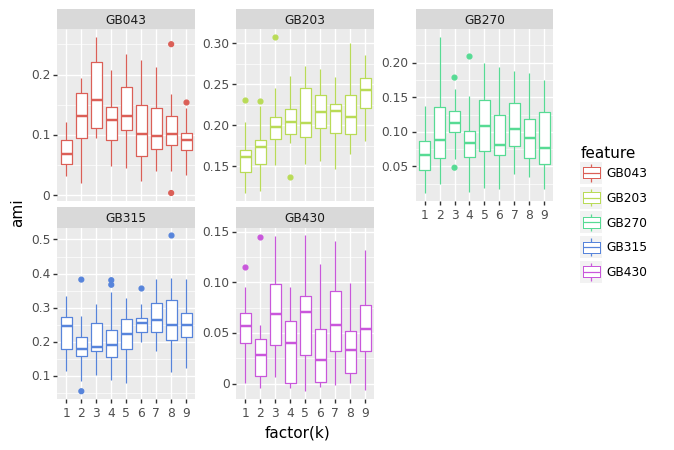

In [21]:
# plot
p = ggplot(accs, aes(x='factor(k)', y='ami', color='feature')) + geom_boxplot() +\
    facet_wrap('feature', scales="free_y") + theme(subplots_adjust={'wspace': 0.3})
print(p)

Now let's try every feature with $k = 5$! I'll collect both accuracy and AMI to show how accuracy is a misleading metric.

As you see below, we get a big range of AMIs from 0.0 (coordinates are not useful for prediction, over not knowing anything) to 0.41 (coordinates give a lot of information).

Also note that accuracy is >0.85 for the bottom 5 best predicted features by AMI! This is because these features are very skewed, i.e. there are some rare languages that have a certain outcome that geographical information can't help guess. We can plot AMI vs. accuracy to see this.

In [26]:
# results
accs = []

# all features
features = list(parameters.keys())

# train knns
for feature in tqdm(features):
    
    avg_acc = 0.0
    avg_ami = 0.0
    for trial in range(10):
        knn, X_test, y_test, y_pred, acc, ami = train_knn(['Latitude', 'Longitude'], feature, k=5)
        avg_acc += acc
        avg_ami += ami
        
    accs.append({
        'feature': feature,
        'acc': avg_acc / 10,
        'ami': avg_ami / 10
    })

# df
accs_latlong = pd.DataFrame(accs)

# print top
sort_latlong = accs_latlong.sort_values(by='ami', ascending=False)
sort_latlong

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 195/195 [00:29<00:00,  6.69it/s]


,feature,acc,ami
38,GB074,0.853084,0.398549
83,GB133,0.838116,0.356155
173,GB333,0.853582,0.335557
28,GB057,0.863678,0.322596
17,GB042,0.886994,0.321264
...,...,...,...
56,GB099,0.910540,0.004716
138,GB285,0.981449,0.000000
118,GB197,0.986207,0.000000
104,GB166,0.987028,0.000000


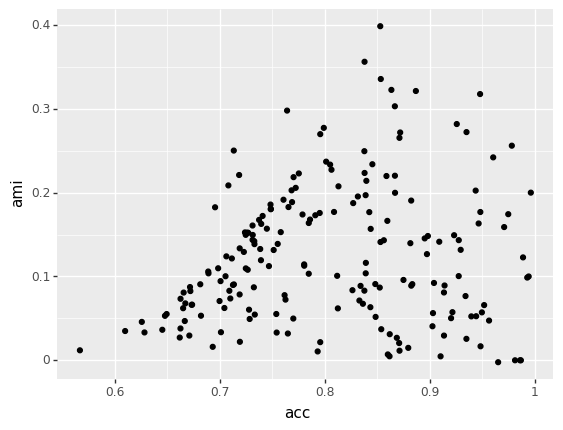

In [27]:
# plot ami vs acc
p = ggplot(sort_latlong, aes(x='acc', y='ami')) + geom_point()
print(p)

The top 5 features by AMI are:
- **GB074: "Are there prepositions?"** -- Prepositions are words like "for" and "in" in English
- **GB333: "Is there a decimal numeral system?"** -- Is the number system in base 10? Some languages use base-20, base-8, base-12, etc.
- **GB297: "Can polar interrogation be indicated by a V-not-V construction?"** -- Some languages (like Mandarin) can ask yes-or-no questions by saying "did you [verb] or not [verb]?"
- **GB133: "Is a pragmatically unmarked constituent order verb-final for transitive clauses?"** -- In English word order is subject-verb-object, so verbs don't go at the end of the sentence. In most languages though, verbs go at the end.
- **GB042: "Is there a productive overt morphological singular marker on nouns?"** -- English has the *-s* ending for plurals (like "dog" ~ "dogs"). Some languages have a singular marker instead!

All of these are known to be affected by geography more than other linguistic features. For example, prepositions developed in lots of historically unrelated European languages probably due to contact and exchange. The base-10 number system gets borrowed by many languages due to its utility and use by the languages of many Western countries--it's hard to convert bases when dealing with money or trade. And so on for the rest.

Now let's map the feature with highest AMI to see if it's actually geographically defined. 

In [28]:
feature = values[values['Parameter_ID'] == 'GB074'].merge(languages, left_on='Language_ID', right_on='ID', how='left')

# family names as codes (for colours)
feature['Value_code'] = feature['Value'].astype('category').cat.codes
feature = feature.dropna(subset=['Latitude', 'Longitude'], how='any')

# make color map
colors = plt.cm.tab10(list(range(len(feature['Value_code'].unique()))))
color_dict = {code: colors[i] for i, code in enumerate(feature['Value_code'].unique())}

# base map
m = folium.Map(location=[0, 0], zoom_start=2)

# add points
for idx, row in feature.iterrows():
    popup_text = f"{row['Name']}\n{row['Value']}"
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,  # Adjust size if needed
        color=matplotlib.colors.to_hex(color_dict[row['Value_code']]),
        fill=True,
        fill_opacity=0.8,
        weight=0,
        popup=folium.Popup(popup_text, parse_html=True)  # Add a popup to the CircleMarker
    ).add_to(m)

# display
m

This is very nicely geographically grouped! Orange means "yes"--you can see very homogenous clusters of that colour in Mesoamerica, Central Africa, Europe, the Middle East, and Southeast Asia.

The greens are languages for which this information is missing (coded as NaN). I would definitely bet on being able to guess whether these have prepositions or not just based on their location.

## Starving the model: Only latitude or longitude

What matters more in linguistic features: latitude or longitude? Do languages of similar latitudes (and thus likely similar climates, day cycles, etc.) tend to share linguistic features?

Since we are using an information theoretic metric--AMI--to see how good our model is, we can try depriving some information from the model and thus check whether latitude or longitude is more useful for predicting certain features. This will be interesting, since the model has a lot less information now.

In [30]:
# results
accs = []

# all features
features = list(parameters.keys())

# train knns
for feature in tqdm(features):
    
    for inp in ['Latitude', 'Longitude']:
        avg_acc = 0.0
        avg_ami = 0.0
        for trial in range(10):
            # only latitude
            knn, X_test, y_test, y_pred, acc, ami = train_knn([inp], feature, k=5)
            avg_acc += acc
            avg_ami += ami

        accs.append({
            'feature': feature,
            'acc': avg_acc / 10,
            'ami': avg_ami / 10,
            'input': inp
        })

# df
accs = pd.DataFrame(accs)

# print top
sort = accs.sort_values(by='ami', ascending=False)
sort

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 195/195 [00:54<00:00,  3.59it/s]


,feature,acc,ami,input
206,GB165,0.997190,0.300000,Latitude
377,GB431,0.847185,0.219201,Longitude
77,GB074,0.759692,0.202026,Longitude
321,GB319,0.995556,0.200000,Longitude
296,GB303,0.995425,0.200000,Latitude
...,...,...,...,...
136,GB116,0.950646,-0.002564,Latitude
112,GB099,0.913882,-0.002750,Latitude
84,GB081,0.837209,-0.002826,Latitude
354,GB400,0.922517,-0.002997,Latitude


In [31]:
# pivot for 'acc'
acc_pivot = sort.pivot(index='feature', columns='input', values='acc')
acc_pivot.columns = [f'acc_{col}' for col in acc_pivot.columns]

# pivot for 'ami'
ami_pivot = sort.pivot(index='feature', columns='input', values='ami')
ami_pivot.columns = [f'ami_{col}' for col in ami_pivot.columns]

# merge
sort_pivot = acc_pivot.join(ami_pivot).reset_index()
sort_pivot.head()

,feature,acc_Latitude,acc_Longitude,ami_Latitude,ami_Longitude
0,GB020,0.587045,0.659318,0.005751,0.050534
1,GB021,0.843243,0.857207,-0.000922,0.012763
2,GB022,0.706561,0.753394,0.006149,0.062859
3,GB023,0.724036,0.736508,0.006327,0.018048
4,GB024,0.590909,0.689091,0.050972,0.167840


Interestingly, looking at AMI we see pretty much all features are guessed poorly by the model. AMI seems a bit more skewed towards longitude (east-west location), so it seems that is more useful. But, these numbers are overall much worse than providing both.

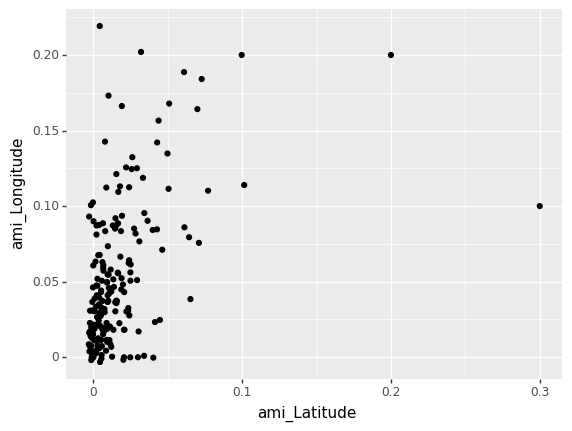

In [32]:
p = ggplot(sort_pivot, aes(x='ami_Latitude', y='ami_Longitude')) + geom_point()
print(p)

Accuracy is a misleading metric! It makes it seem that there is a nice correlation, but actually that's because the model is essentially guessing the majority value either way--it doesn't have useful information to work off of.

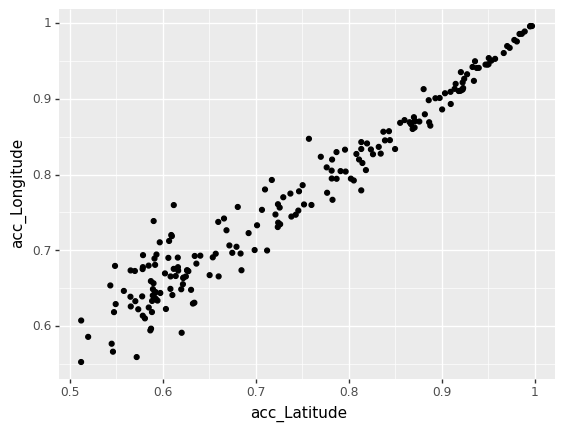

In [33]:
p = ggplot(sort_pivot, aes(x='acc_Latitude', y='acc_Longitude')) + geom_point()
print(p)

## Adding historical information: language family

How much does historical information help in predicting features? To find out, I'll run the KNN but this time with additional information about which language family the language belongs to. Since family is a categorical variable, I'll use a one-hot encoding to pass in this information to the model. This may heavily weight family in the model, but let's see how it does.

In [34]:
# make categorical
pivot_df_ext['Family_name'] = pd.Categorical(pivot_df_ext['Family_name'])
pivot_df_ext.head()

,Language_ID,GB020,GB021,GB022,GB023,GB024,GB025,GB026,GB027,GB028,...,Longitude,Glottocode,ISO639P3code,provenance,Family_name,Family_level_ID,Language_level_ID,level,lineage,Family_code
0,abad1241,NaN,NaN,NaN,NaN,N-Num,Dem-N,absent,absent,present,...,146.99200,abad1241,NaN,JLA_abad1241.tsv,Austronesian,aust1307,abad1241,language,aust1307/mala1545/cent2237/east2712/ocea1241/w...,13
1,abar1238,present,absent,absent,present,N-Num,N-Dem,absent,absent,absent,...,10.22670,abar1238,NaN,ML_abar1238.tsv,Atlantic-Congo,atla1278,abar1238,language,atla1278/volt1241/benu1247/bant1294/sout3152/y...,11
2,abau1245,absent,absent,absent,absent,N-Num,N-Dem,absent,present,absent,...,141.32400,abau1245,NaN,MD-GR-RSI_abau1245.tsv,Sepik,sepi1257,abau1245,language,sepi1257,162
3,abee1242,present,absent,absent,present,N-Num,N-Dem,NaN,present,absent,...,-4.38497,abee1242,NaN,RHE_abee1242.tsv,Atlantic-Congo,atla1278,abee1242,language,atla1278/volt1241/kwav1236/nyoa1234/agne1238,11
4,aben1249,absent,absent,absent,absent,Num-N,Dem-N,NaN,NaN,present,...,120.20000,aben1249,NaN,SR_aben1249.tsv,Austronesian,aust1307,aben1249,language,aust1307/mala1545/cent2080/samb1319/abel1234,13


In [35]:
# one-hot encode
pivot_df_ext = pd.get_dummies(pivot_df_ext, columns=['Family_name'], prefix=['Family_name'])
pivot_df_ext.head()

,Language_ID,GB020,GB021,GB022,GB023,GB024,GB025,GB026,GB027,GB028,...,Family_name_Yanomamic,Family_name_Yareban,Family_name_Yawa-Saweru,Family_name_Yeniseian,Family_name_Yokutsan,Family_name_Yuat,Family_name_Yukaghir,Family_name_Yuki-Wappo,Family_name_Zamucoan,Family_name_Zaparoan
0,abad1241,NaN,NaN,NaN,NaN,N-Num,Dem-N,absent,absent,present,...,0,0,0,0,0,0,0,0,0,0
1,abar1238,present,absent,absent,present,N-Num,N-Dem,absent,absent,absent,...,0,0,0,0,0,0,0,0,0,0
2,abau1245,absent,absent,absent,absent,N-Num,N-Dem,absent,present,absent,...,0,0,0,0,0,0,0,0,0,0
3,abee1242,present,absent,absent,present,N-Num,N-Dem,NaN,present,absent,...,0,0,0,0,0,0,0,0,0,0
4,aben1249,absent,absent,absent,absent,Num-N,Dem-N,NaN,NaN,present,...,0,0,0,0,0,0,0,0,0,0


In [36]:
one_hot_fams = [x for x in list(pivot_df_ext.columns) if x.startswith('Family_name_')]
one_hot_fams += ['Latitude', 'Longitude']

# results
accs = []

# all features
features = list(parameters.keys())

# train knns
for feature in tqdm(features):
    
    avg_acc = 0.0
    avg_ami = 0.0
    for trial in range(10):
        # only latitude
        knn, X_test, y_test, y_pred, acc, ami = train_knn(one_hot_fams, feature, k=5)
        avg_acc += acc
        avg_ami += ami

    accs.append({
        'feature': feature,
        'acc': avg_acc / 10,
        'ami': avg_ami / 10,
    })

# df
accs = pd.DataFrame(accs)

# print top
sort = accs.sort_values(by='ami', ascending=False)
sort

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 195/195 [01:33<00:00,  2.09it/s]


,feature,acc,ami
38,GB074,0.888106,0.493286
106,GB170,0.910070,0.451946
83,GB133,0.872805,0.445836
119,GB198,0.904369,0.402813
82,GB132,0.838710,0.365312
...,...,...,...
99,GB156,0.961219,0.018415
186,GB422,0.862946,0.011142
104,GB166,0.986321,0.000000
138,GB285,0.979130,0.000000


In [39]:
# merge with sort_latlong
combined = sort_latlong.merge(sort, on='feature')
combined['ami_diff'] = combined['ami_y'] - combined['ami_x']
combined.head()

,feature,acc_x,ami_x,acc_y,ami_y
0,GB074,0.853084,0.398549,0.888106,0.493286
1,GB133,0.838116,0.356155,0.872805,0.445836
2,GB333,0.853582,0.335557,0.859599,0.344706
3,GB057,0.863678,0.322596,0.863448,0.306995
4,GB042,0.886994,0.321264,0.889765,0.324331


Adding family info improves AMI in 151 / 195 features
Adding family info improves accuracy in 146 / 195 features


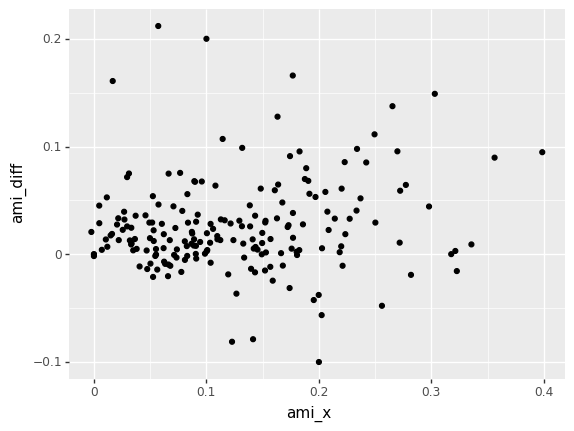

In [53]:
# stats
stats = Counter(combined['ami_y'] > combined['ami_x'])
print(f'Adding family info improves AMI in {stats[True]} / {len(combined)} features')
stats = Counter(combined['acc_y'] > combined['acc_x'])
print(f'Adding family info improves accuracy in {stats[True]} / {len(combined)} features')

# plot
p = ggplot(combined, aes(x='ami_x', y='ami_diff')) + geom_point()
print(p)

Looks like adding family information mostly helps, even when the classifier is already pretty good!

# Interpretation

Now we have arrived at the end of our journey. I hope you learned some new things about languages and their diversity, and the value of data science to what are thought of as non-STEM fields.

Here are some of the takeaways we got from this exploration:

1. Many linguistic features are correlated. Languages are not collections of random traits; some traits evolve together. (For example, how a language indicates the subject on a transitive or intransitive verb tends to be the same.)
2. Many features are susceptible to spread by geographic contact, even between unrelated languages, e.g. prepositions. We know this because for such features, just geography is sufficient to predict them.
3. Longitude is slightly better than latitude for predicting linguistic features, but mostly they are individually useless compared to having both coordinates.
4. Historical information does help in predicting language features, even those that are highly defined by geography.

And I hope this is a big data science takeway!

1. Information theoretic metrics like AMI are really useful for understanding if the model we're using is actually learning something better than guessing.

Overall, this is what I'd recommend to linguists based on these takeways:

1. Collect more information about linguistic features that are uncorrelated to known ones in the dataset. Every feature with high correlation to an existing one tells us very little about languages, since we could already guess its value with high certainty.
2. Look more into potential geographic vs. historical effects on linguistic features. This is studied in the subfield of historical linguistics and linguistic typology--I think it deserves a lot more attention!

Thank you for reading! If you are interested in learning more about linguistic features or looking at cool maps, I highly suggest checking out the [GramBank website](https://grambank.clld.org/).